In [1]:
import pandas as pd
from scipy import stats
import numpy as np
import scipy
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline
import datetime
import plotly
import plotly.graph_objs as go
from plotly.subplots import make_subplots

import warnings
warnings.filterwarnings('ignore') 

**Features**

* weather code -> The most severe weather condition on a given day

* temperature_2m_max, temperature_2m_min -> Maximum and minimum daily air temperature at 2 meters above ground

* apparent_temperature_max, apparent_temperature_min ->Maximum and minimum daily apparent temperature

* precipitation_sum -> Sum of daily precipitation (including rain, showers and snowfall)

* rain_sum -> Sum of daily rain

* snowfall_sum -> Sum of daily snowfall

* precipitation_hours -> The number of hours with rain

* sunrise, sunset -> Sun rise and set times

* windspeed_10m_max, windgusts_10m_max -> Maximum wind speed and gusts on a day

* winddirection_10m_dominant -> Dominant wind direction

* shortwave_radiation_sum -> The sum of solar radiaion on a given day in cities

* et0_fao_evapotranspiration -> Daily sum of ET₀ Reference Evapotranspiration of a well watered grass field

**Unit**

* Temperature -> °C (°F)

* precipitation_sum -> mm

* rain_sum -> mm

* snowfall_sum -> cm

* precipitation_hours -> hours

* Windspeed -> km/h

* shortwave_radiation_sum -> MJ/m²

* et0_fao_evapotranspiration -> mm

In [2]:
df = pd.read_csv('open_meteo.csv', sep=',', na_values='\xa0' )
df.head()

,Unnamed: 0,time,weathercode,temperature_2m_max,temperature_2m_min,temperature_2m_mean,apparent_temperature_max,apparent_temperature_min,apparent_temperature_mean,sunrise,...,precipitation_hours,windspeed_10m_max,windgusts_10m_max,winddirection_10m_dominant,et0_fao_evapotranspiration,latitude,longitude,elevation,country,city
0,0,1/1/2010,0,26.0,14.8,20.9,24.0,13.4,18.6,2010-01-01T02:16,...,0,18.3,25.6,54,4.38,24.900002,67.0,8,Pakistan,Karachi
1,1,1/2/2010,2,25.3,15.6,20.5,21.8,13.7,18.1,2010-01-02T02:17,...,0,24.6,35.3,64,3.84,24.900002,67.0,8,Pakistan,Karachi
2,2,1/3/2010,0,25.0,14.3,19.9,22.8,14.2,18.9,2010-01-03T02:17,...,0,16.6,28.1,312,3.69,24.900002,67.0,8,Pakistan,Karachi
3,3,1/4/2010,0,25.6,15.0,20.4,23.9,13.7,19.4,2010-01-04T02:17,...,0,14.0,22.7,353,3.63,24.900002,67.0,8,Pakistan,Karachi
4,4,1/5/2010,0,25.4,16.3,20.7,24.5,16.8,20.7,2010-01-05T02:17,...,0,19.3,29.2,270,3.55,24.900002,67.0,8,Pakistan,Karachi


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 34762 entries, 0 to 34761
Data columns (total 25 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   Unnamed: 0                  34762 non-null  int64  
 1   time                        34762 non-null  object 
 2   weathercode                 34762 non-null  int64  
 3   temperature_2m_max          34762 non-null  float64
 4   temperature_2m_min          34762 non-null  float64
 5   temperature_2m_mean         34762 non-null  float64
 6   apparent_temperature_max    34762 non-null  float64
 7   apparent_temperature_min    34762 non-null  float64
 8   apparent_temperature_mean   34762 non-null  float64
 9   sunrise                     34762 non-null  object 
 10  sunset                      34762 non-null  object 
 11  shortwave_radiation_sum     34762 non-null  float64
 12  precipitation_sum           34762 non-null  float64
 13  rain_sum                    347

In [4]:
df=df.drop("Unnamed: 0", axis=1)

In [5]:
df.shape

(34762, 24)

In [6]:
df.isna().sum()

time                          0
weathercode                   0
temperature_2m_max            0
temperature_2m_min            0
temperature_2m_mean           0
apparent_temperature_max      0
apparent_temperature_min      0
apparent_temperature_mean     0
sunrise                       0
sunset                        0
shortwave_radiation_sum       0
precipitation_sum             0
rain_sum                      0
snowfall_sum                  0
precipitation_hours           0
windspeed_10m_max             0
windgusts_10m_max             0
winddirection_10m_dominant    0
et0_fao_evapotranspiration    0
latitude                      0
longitude                     0
elevation                     0
country                       0
city                          0
dtype: int64

In [7]:
# convert the columns 'time', "sunrise" and 'sunsete' to datetime64:

df['time']=pd.to_datetime(df['time'])
df['sunrise']=pd.to_datetime(df['sunrise'])
df['sunset']=pd.to_datetime(df['sunset'])

In [8]:
# Value counts for each categorical feature: 

for column in df.select_dtypes(include=['object']):
    print(f"Value counts for {column}:")
    print(df[column].value_counts())
    print()

Value counts for country:
India       29796
Pakistan     4966
Name: country, dtype: int64

Value counts for city:
Karachi       4966
Trivandrum    4966
Mangalore     4966
Old Goa       4966
Mumbai        4966
Surat         4966
Bhuj          4966
Name: city, dtype: int64



In [9]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
weathercode,34762.0,24.229417,27.551242,0.00,1.000000,2.000000,53.000000,65.000000
temperature_2m_max,34762.0,30.677150,3.236343,17.70,28.300000,30.500000,32.800000,44.300000
temperature_2m_min,34762.0,23.205748,3.615309,6.80,21.700000,24.200000,25.500000,32.500000
temperature_2m_mean,34762.0,26.674475,2.733634,13.20,25.500000,26.800000,28.300000,37.100000
apparent_temperature_max,34762.0,33.920612,4.309410,11.80,31.800000,34.400000,36.800000,47.100000
apparent_temperature_min,34762.0,26.026771,5.710073,1.40,23.500000,27.900000,29.800000,37.400000
apparent_temperature_mean,34762.0,29.564956,4.509885,7.60,28.200000,30.500000,32.400000,41.100000
shortwave_radiation_sum,34762.0,19.105281,5.091534,0.72,16.670000,19.570000,22.610000,29.320000
precipitation_sum,34762.0,4.496036,12.391169,0.00,0.000000,0.000000,2.800000,307.900000
rain_sum,34762.0,4.496036,12.391169,0.00,0.000000,0.000000,2.800000,307.900000


In [10]:
# Insight into "weathercode" :

print(df['weathercode'].nunique())
print(df['weathercode'].unique())
#print(df['weathercode'].value_counts())

10
[ 0  2 51  1  3 61 53 63 65 55]


In [11]:
# Insight into 'snowfall_sum' :

print(df['snowfall_sum'].nunique())
print(df['snowfall_sum'].unique())
print(df['snowfall_sum'].value_counts())

1
[0]
0    34762
Name: snowfall_sum, dtype: int64


In [12]:
# Comparing 'rain_sum'and 'precipitation_sum':

comparison_result = df['rain_sum'] == df['precipitation_sum']
comparison_result

0        True
1        True
2        True
3        True
4        True
         ... 
34757    True
34758    True
34759    True
34760    True
34761    True
Length: 34762, dtype: bool

In [13]:
# Drop columns "snowfall_sum", "rain_sum":

df = df.drop(["snowfall_sum", "rain_sum"], axis=1)

In [14]:
# Calculating "precipitation_rate"

df["precipitation_rate"]=df["precipitation_sum"]/df["precipitation_hours"]
df["precipitation_rate"].fillna(0,inplace=True)

In [15]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 34762 entries, 0 to 34761
Data columns (total 23 columns):
 #   Column                      Non-Null Count  Dtype         
---  ------                      --------------  -----         
 0   time                        34762 non-null  datetime64[ns]
 1   weathercode                 34762 non-null  int64         
 2   temperature_2m_max          34762 non-null  float64       
 3   temperature_2m_min          34762 non-null  float64       
 4   temperature_2m_mean         34762 non-null  float64       
 5   apparent_temperature_max    34762 non-null  float64       
 6   apparent_temperature_min    34762 non-null  float64       
 7   apparent_temperature_mean   34762 non-null  float64       
 8   sunrise                     34762 non-null  datetime64[ns]
 9   sunset                      34762 non-null  datetime64[ns]
 10  shortwave_radiation_sum     34762 non-null  float64       
 11  precipitation_sum           34762 non-null  float64   

In [16]:
# Insight into 'precipitation_rate' :

df["precipitation_rate"].describe().T

count    34762.000000
mean         0.266539
std          0.577008
min          0.000000
25%          0.000000
50%          0.000000
75%          0.300000
max         12.829167
Name: precipitation_rate, dtype: float64

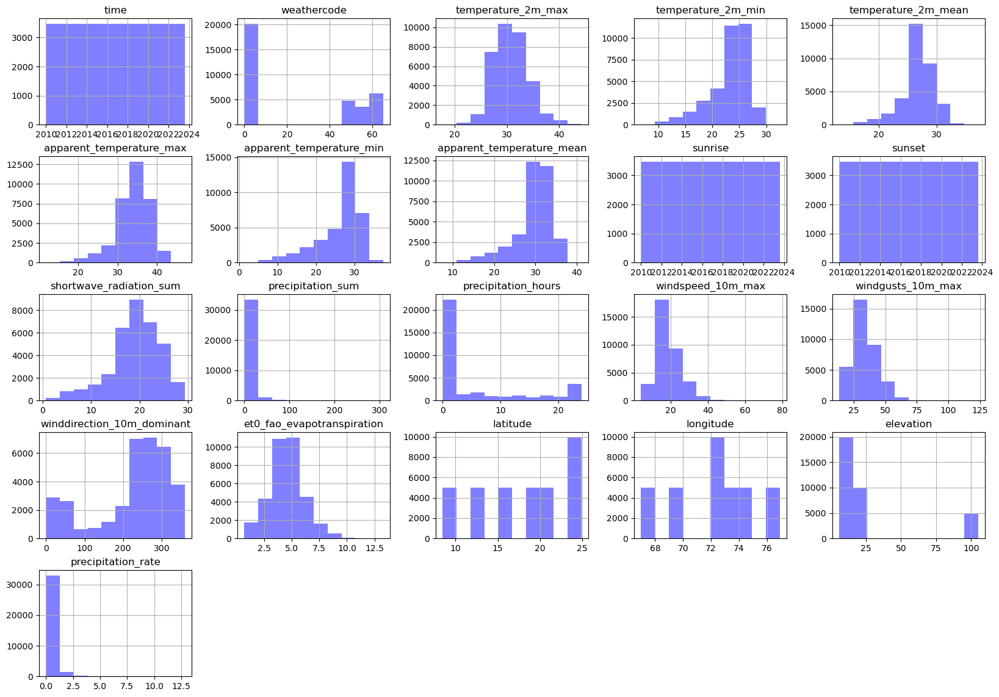

In [17]:
df.hist( color='b', figsize=(20,14), alpha=0.5)
plt.show()

**Correlation**

In [18]:
# Finding correlation:

df_corr=df.corr(method='pearson')
df_corr

,weathercode,temperature_2m_max,temperature_2m_min,temperature_2m_mean,apparent_temperature_max,apparent_temperature_min,apparent_temperature_mean,shortwave_radiation_sum,precipitation_sum,precipitation_hours,windspeed_10m_max,windgusts_10m_max,winddirection_10m_dominant,et0_fao_evapotranspiration,latitude,longitude,elevation,precipitation_rate
weathercode,1.000000,-0.392992,0.419267,0.043782,0.036986,0.463978,0.312140,-0.565586,0.492457,0.798948,-0.039648,0.163460,0.159036,-0.648821,-0.421010,0.406406,-0.155695,0.608248
temperature_2m_max,-0.392992,1.000000,0.365717,0.795381,0.770722,0.318922,0.533749,0.627918,-0.316834,-0.467669,0.119650,0.051895,0.048061,0.737156,0.253616,-0.211563,0.229160,-0.302311
temperature_2m_min,0.419267,0.365717,1.000000,0.843610,0.710549,0.968075,0.915501,0.008572,0.173475,0.304305,0.244884,0.311227,0.276874,-0.040588,-0.206134,0.210776,-0.202132,0.223402
temperature_2m_mean,0.043782,0.795381,0.843610,1.000000,0.891157,0.799000,0.893863,0.361263,-0.070939,-0.074027,0.208472,0.204802,0.212013,0.392291,0.013793,0.018189,-0.004018,-0.032522
apparent_temperature_max,0.036986,0.770722,0.710549,0.891157,1.000000,0.744511,0.903462,0.421582,-0.118883,-0.124040,-0.129664,-0.063489,0.205724,0.299954,-0.181135,0.216976,-0.113672,-0.050339
apparent_temperature_min,0.463978,0.318922,0.968075,0.799000,0.744511,1.000000,0.951362,0.002994,0.171246,0.326801,0.104405,0.204036,0.334189,-0.128792,-0.290937,0.286477,-0.236515,0.235179
apparent_temperature_mean,0.312140,0.533749,0.915501,0.893863,0.903462,0.951362,1.000000,0.164722,0.063904,0.158033,-0.005024,0.091390,0.300309,0.028675,-0.259233,0.270035,-0.208277,0.132064
shortwave_radiation_sum,-0.565586,0.627918,0.008572,0.361263,0.421582,0.002994,0.164722,1.000000,-0.603163,-0.678171,0.076481,-0.044808,0.107222,0.861679,0.102105,-0.111216,0.082669,-0.584261
precipitation_sum,0.492457,-0.316834,0.173475,-0.070939,-0.118883,0.171246,0.063904,-0.603163,1.000000,0.670490,0.095223,0.274753,0.061396,-0.528913,-0.158975,0.168693,-0.103462,0.938937
precipitation_hours,0.798948,-0.467669,0.304305,-0.074027,-0.124040,0.326801,0.158033,-0.678171,0.670490,1.000000,0.038314,0.272219,0.127854,-0.697587,-0.333308,0.341158,-0.179820,0.643664


In [19]:
# Correlation Rate for shortwave_radiation_sum":

df_corr["shortwave_radiation_sum"].sort_values(ascending=False)

shortwave_radiation_sum       1.000000
et0_fao_evapotranspiration    0.861679
temperature_2m_max            0.627918
apparent_temperature_max      0.421582
temperature_2m_mean           0.361263
apparent_temperature_mean     0.164722
winddirection_10m_dominant    0.107222
latitude                      0.102105
elevation                     0.082669
windspeed_10m_max             0.076481
temperature_2m_min            0.008572
apparent_temperature_min      0.002994
windgusts_10m_max            -0.044808
longitude                    -0.111216
weathercode                  -0.565586
precipitation_rate           -0.584261
precipitation_sum            -0.603163
precipitation_hours          -0.678171
Name: shortwave_radiation_sum, dtype: float64

* "shortwave_radiation_sum" has a very strong positive correlation with "et0_fao_evapotranspiration" (0.861). This suggests that higher values of shortwave radiation are associated with higher values of evapotranspiration.


* There is a moderate positive correlation between "shortwave_radiation_sum" and "temperature_2m_max" (0.628), indicating that higher shortwave radiation is related to higher maximum temperatures.


* "apparent_temperature_max" and "temperature_2m_mean" also show positive correlations with shortwave_radiation_sum (0.422 and 0.361, respectively), though the relationships are not as strong as with some other variables.


* "weathercode", "precipitation_rate", "precipitation_sum", and "precipitation_hours" have strong negative correlations with shortwave_radiation_sum (-0.566, -0.584, -0.603, -0.678). This indicates that higher shortwave radiation is associated with lower values of these weather-related variables, suggesting that increased radiation is correlated with less precipitation and rainy weather.

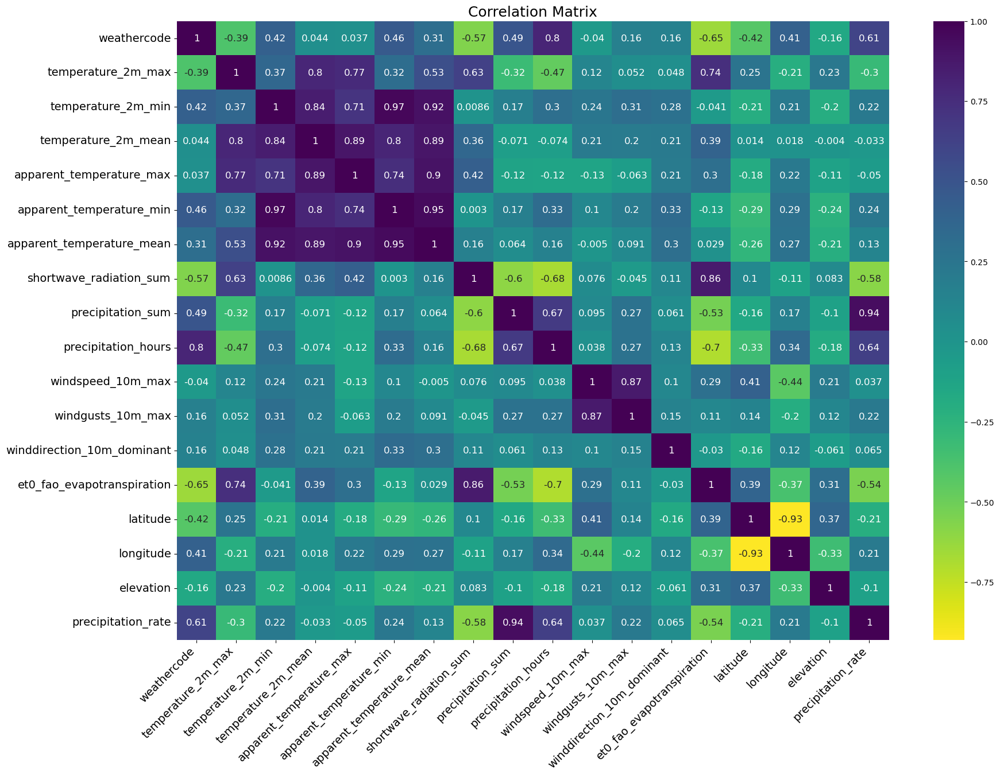

In [20]:
# Correlation Matriz:

corr_matrix = df.corr()
plt.figure(figsize=(20, 14))
sns_plot = sns.heatmap(corr_matrix, annot=True, cmap='viridis_r', annot_kws={"size": 12})
sns_plot.set_xticklabels(sns_plot.get_xticklabels(), rotation=45, horizontalalignment='right', fontsize=14)
sns_plot.set_yticklabels(sns_plot.get_yticklabels(), rotation=0, verticalalignment='center', fontsize=14)
plt.title('Correlation Matrix', fontsize=18)
plt.show()

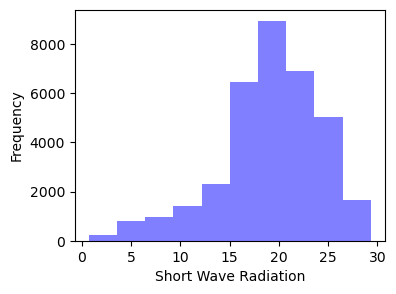

In [21]:
# Insight into "shortwave_radiation_sum" - Histogram:

plt.figure(figsize=(4, 3))
plt.hist(df['shortwave_radiation_sum'], alpha=0.5, color='b')
plt.xlabel('Short Wave Radiation')
plt.ylabel('Frequency')
plt.show()

**Shortwave Radiation and City-Country**

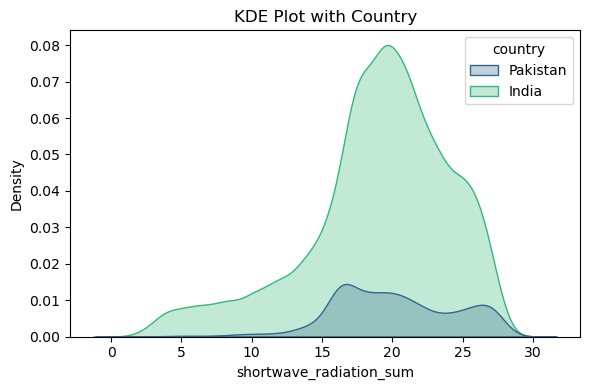

In [22]:
# KDE Plot for Shortwave Radiation and Country:

fig, ax = plt.subplots(figsize = (6,4))

sns.kdeplot(data=df, x="shortwave_radiation_sum", alpha=0.3, shade = True,  hue='country', palette='viridis',ax=ax)
ax.set_xlabel('shortwave_radiation_sum')
ax.set_ylabel('Density')
ax.set_title('KDE Plot with Country')
plt.tight_layout()
plt.show()

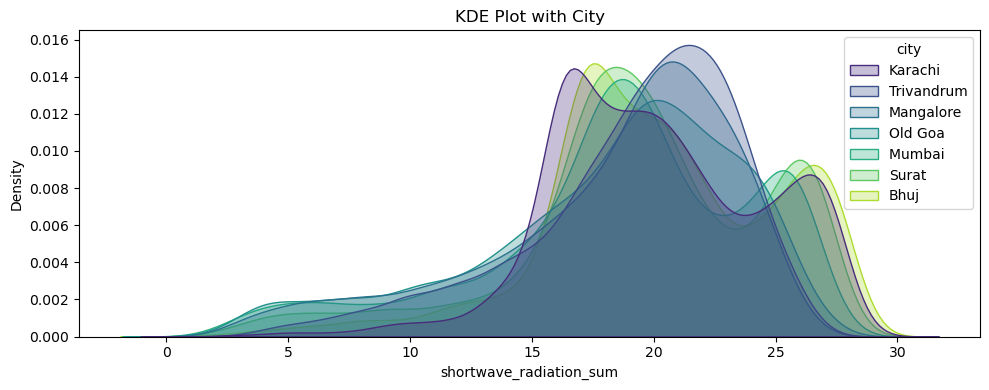

In [23]:
# KDE Plot for Shortwave Radiation and City:

fig, ax = plt.subplots(figsize = (10,4))

sns.kdeplot(data=df, x="shortwave_radiation_sum", alpha=0.3, shade = True,  hue='city', palette='viridis',ax=ax)
ax.set_xlabel('shortwave_radiation_sum')
ax.set_ylabel('Density')
ax.set_title('KDE Plot with City')
plt.tight_layout()
plt.show()

In [24]:
# Mean Shortwave Radiation Bar Graph grouped by Country and City - Mean:

df1=df.groupby('city')['shortwave_radiation_sum'].mean()
df1=df1.reset_index()
df2=df.groupby('country')['shortwave_radiation_sum'].mean()
df2=df2.reset_index()

fig = make_subplots(rows=1, cols=2, vertical_spacing=0.2,subplot_titles=["city", "country"])

trace1 = go.Bar(x=df1['city'], y=df1['shortwave_radiation_sum'], marker=dict(color='green', opacity=0.5))
fig.add_trace(trace1, row=1, col=1)

trace2 = go.Bar(x=df2['country'], y=df2['shortwave_radiation_sum'], marker=dict(color='blue', opacity=0.5))
fig.add_trace(trace2, row=1, col=2)

fig.update_layout(title='Bar Graphs', bargap=0.2 , height=400, width=700, showlegend=False, plot_bgcolor='white')
fig.show()

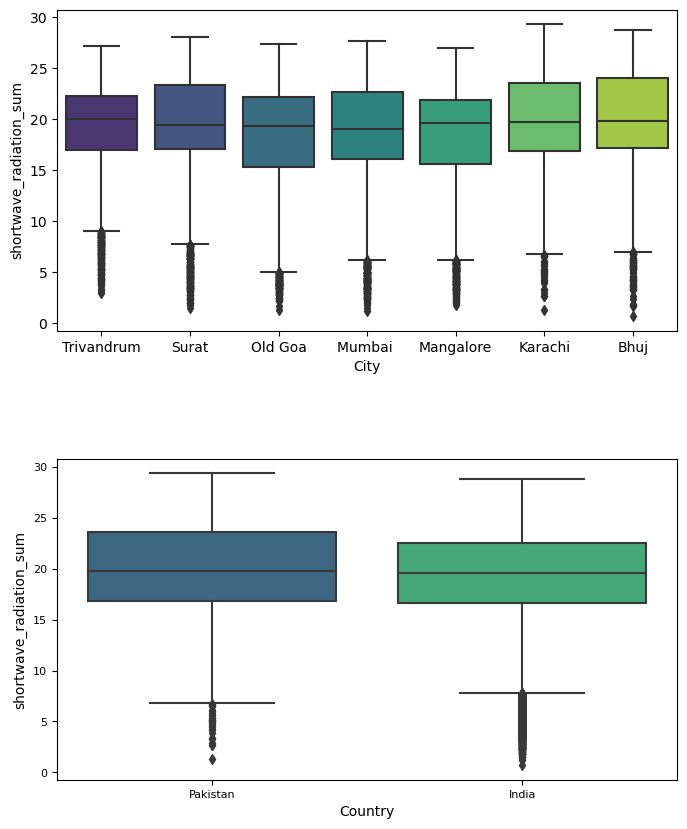

In [25]:
# Box plots of 'shortwave_radiation_sum' for "city" and "country":

fig, axs = plt.subplots(2, 1, figsize=(8, 10), gridspec_kw={'hspace': 0.4})

# Box plot of 'city'
sns.boxplot(x='city', y='shortwave_radiation_sum', palette='viridis', data=df.sort_values('city',ascending=False), ax=axs[0])
axs[0].set_ylabel('shortwave_radiation_sum')
axs[0].set_xlabel('City')

# Box plot of 'country'
sns.boxplot(x='country', y='shortwave_radiation_sum', palette='viridis', data=df.sort_values('country',ascending=False), ax=axs[1])
axs[1].set_ylabel('shortwave_radiation_sum')
axs[1].set_xlabel('Country')
axs[1].tick_params(axis='both', labelsize=8)

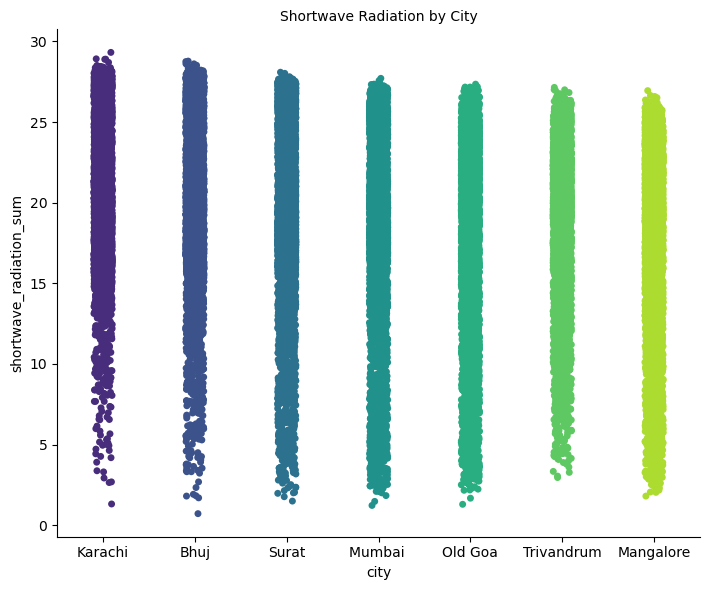

In [26]:
# Cat plot of 'shortwave_radiation_sum' for "city":

sns.catplot(y='shortwave_radiation_sum', x='city', data=df.sort_values('shortwave_radiation_sum', ascending=False), palette='viridis', height=6, aspect=1.2)
plt.ylabel('shortwave_radiation_sum')
plt.xlabel('city')
plt.title('Shortwave Radiation by City', fontsize=10)
plt.tight_layout()
plt.show()

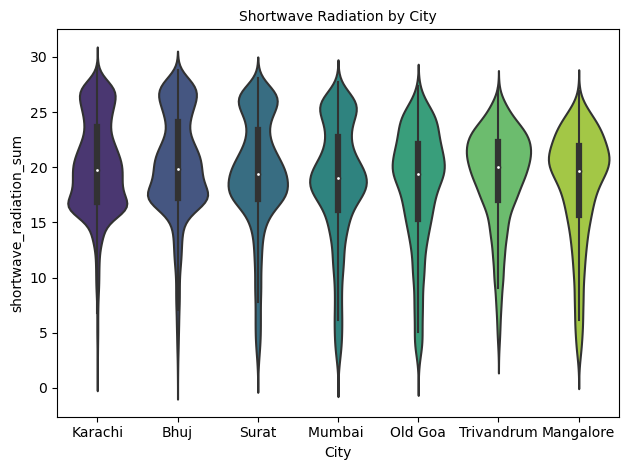

In [27]:
# Violin plot of 'shortwave_radiation_sum' for "city":

sns.violinplot(x='city', y='shortwave_radiation_sum', data=df.sort_values('shortwave_radiation_sum', ascending=False), palette='viridis')
plt.xlabel('City')
plt.ylabel('shortwave_radiation_sum')
plt.title('Shortwave Radiation by City', fontsize=10)
plt.tight_layout()
plt.show()

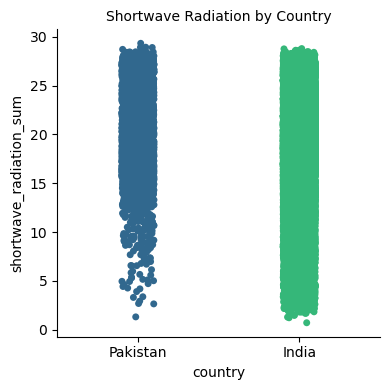

In [28]:
# Cat plot of 'shortwave_radiation_sum' for "country":

sns.catplot(x='country', y='shortwave_radiation_sum', data=df.sort_values('shortwave_radiation_sum', ascending=False), palette='viridis', height=4, aspect=1)
plt.xlabel('country')
plt.ylabel('shortwave_radiation_sum')
plt.title('Shortwave Radiation by Country', fontsize=10)
plt.tight_layout()
plt.show()

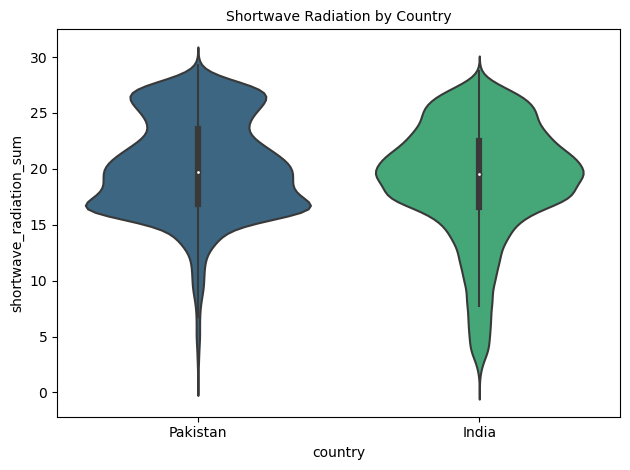

In [29]:
# Violin plot of 'shortwave_radiation_sum' for "country":

sns.violinplot(x='country', y='shortwave_radiation_sum', data=df.sort_values('shortwave_radiation_sum', ascending=False), palette='viridis')
plt.xlabel('country')
plt.ylabel('shortwave_radiation_sum')
plt.title('Shortwave Radiation by Country', fontsize=10)
plt.tight_layout()
plt.show()

**Shortwave Radiation and Weather Code**

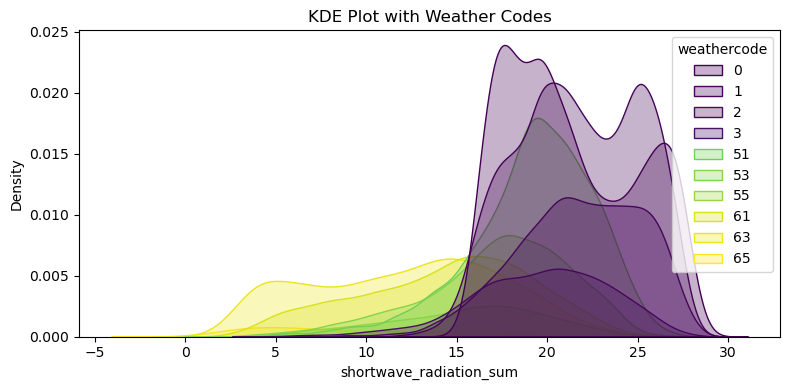

In [30]:
fig, ax = plt.subplots(figsize=(8, 4))

sns.kdeplot(data=df, x="shortwave_radiation_sum", alpha=0.3, shade=True, hue='weathercode', palette='viridis', ax=ax)
ax.set_xlabel('shortwave_radiation_sum')
ax.set_ylabel('Density')
ax.set_title('KDE Plot with Weather Codes')
plt.tight_layout()
plt.show()

In [31]:
# Mean Shortwave Radiation Graph grouped by 'weathercode':

df1=df.groupby('weathercode')['shortwave_radiation_sum'].mean()
df1=df1.reset_index()

fig = make_subplots(rows=1, cols=1, vertical_spacing=0.2,subplot_titles=["weathercode"])

trace1 = go.Bar(x=df1['weathercode'], y=df1['shortwave_radiation_sum'], marker=dict(color='blue', opacity=0.5))
fig.add_trace(trace1, row=1, col=1)

fig.update_layout(title='Bar Graphs', bargap=0.2 , height=400, width=400, showlegend=False, paper_bgcolor='white')
fig.show()

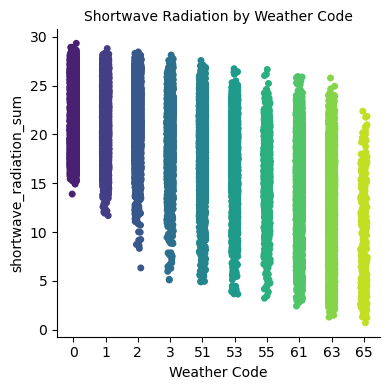

In [32]:
# Cat plot of 'shortwave_radiation_sum' for "weathercode":

sns.catplot(x='weathercode', y='shortwave_radiation_sum', data=df.sort_values('shortwave_radiation_sum', ascending=False), palette='viridis', height=4, aspect=1)
plt.xlabel('Weather Code')
plt.ylabel('shortwave_radiation_sum')
plt.title('Shortwave Radiation by Weather Code', fontsize=10)
plt.tight_layout()
plt.show()

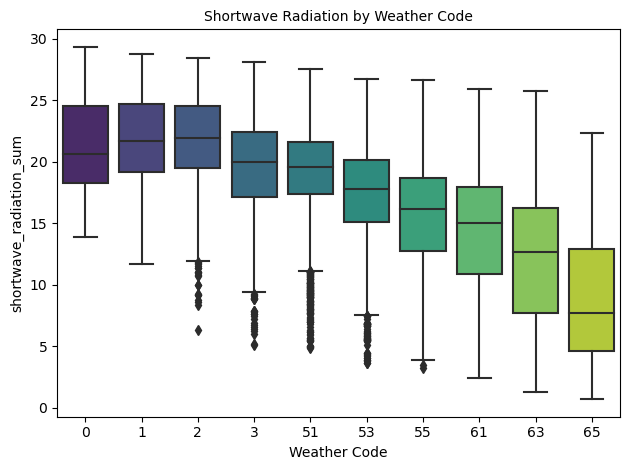

In [33]:
# Box plot of 'shortwave_radiation_sum' for "weathercode":

sns.boxplot(x='weathercode', y='shortwave_radiation_sum', data=df.sort_values('shortwave_radiation_sum', ascending=False), palette='viridis')
plt.xlabel('Weather Code')
plt.ylabel('shortwave_radiation_sum')
plt.title('Shortwave Radiation by Weather Code', fontsize=10)
plt.tight_layout()
plt.show()

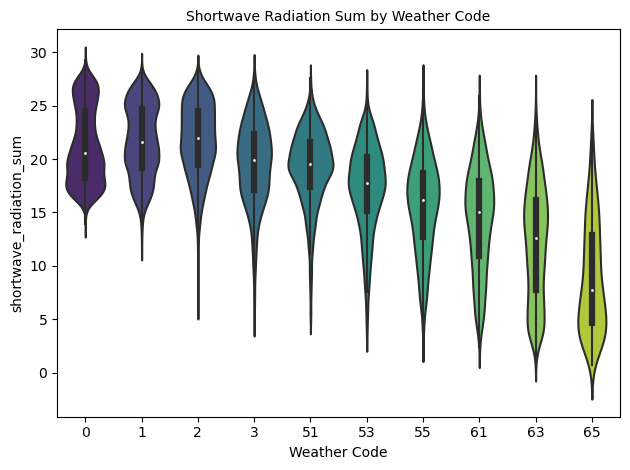

In [34]:
# Violin plot of 'shortwave_radiation_sum' for "weathercode":

sns.violinplot(x='weathercode', y='shortwave_radiation_sum', data=df.sort_values('shortwave_radiation_sum', ascending=False), palette='viridis')
plt.xlabel('Weather Code')
plt.ylabel('shortwave_radiation_sum')
plt.title('Shortwave Radiation Sum by Weather Code', fontsize=10)
plt.tight_layout()
plt.show()

**Shortwave Radiation and Evapotranspiration**

Text(0, 0.5, 'shortwave_radiation_sum')

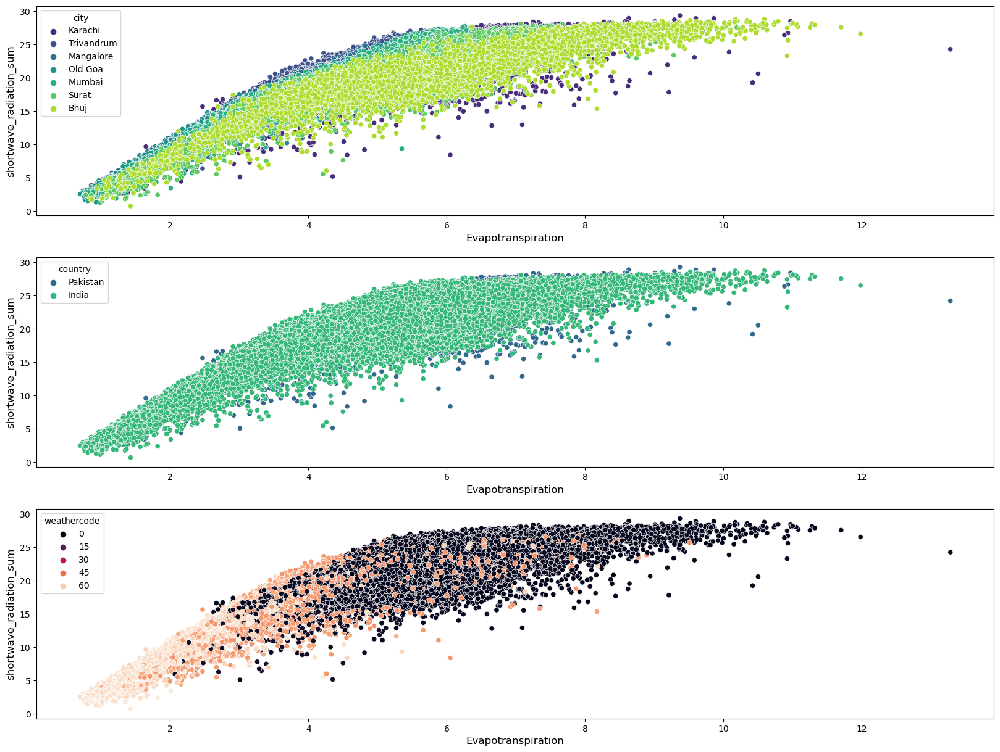

In [35]:
# Scatter plot of Shortwave Radiation and Evapotranspiration :

plt.figure(figsize = (20,15))

#hue='city'
plt.subplot(3,1,1)
sns.scatterplot(x = 'et0_fao_evapotranspiration', y='shortwave_radiation_sum' , hue='city', palette='viridis', data = df)
plt.xlabel('Evapotranspiration', fontsize=12)
plt.ylabel('shortwave_radiation_sum', fontsize=12)

# hue='country'
plt.subplot(3,1,2)
sns.scatterplot(x = 'et0_fao_evapotranspiration', y='shortwave_radiation_sum' , hue='country', palette='viridis', data = df)
plt.xlabel('Evapotranspiration', fontsize=12)
plt.ylabel('shortwave_radiation_sum', fontsize=12)

#hue='weathercode'
plt.subplot(3,1,3)
sns.scatterplot(x = 'et0_fao_evapotranspiration', y='shortwave_radiation_sum' , hue='weathercode', palette='rocket', data = df)
plt.xlabel('Evapotranspiration', fontsize=12)
plt.ylabel('shortwave_radiation_sum', fontsize=12)


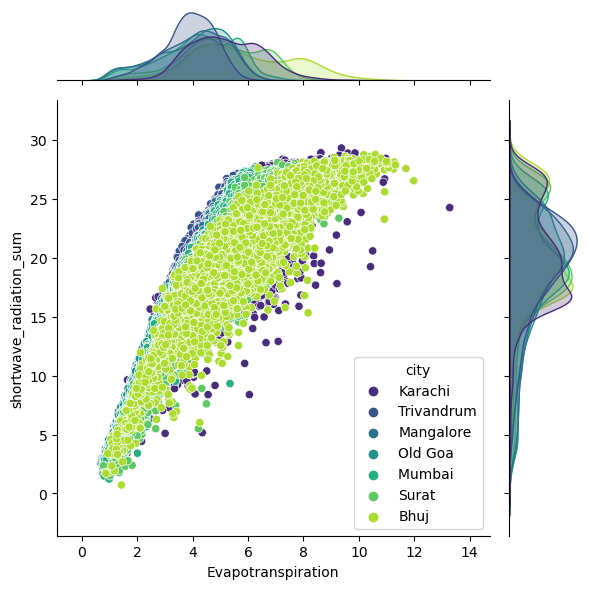

In [36]:
# Joint plot of Shortwave Radiation and Evapotranspiration, hue='city': 

sns.jointplot(x = 'et0_fao_evapotranspiration', y='shortwave_radiation_sum', data=df, hue='city', kind='scatter', palette='viridis', height=6)
plt.xlabel('Evapotranspiration')
plt.ylabel('shortwave_radiation_sum')
plt.tight_layout()
plt.show()


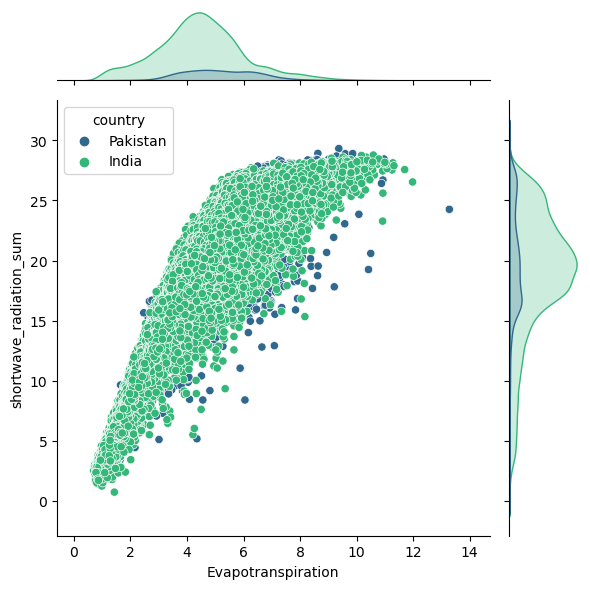

In [37]:
# Joint plot of Shortwave Radiation and Evapotranspiration, hue='country': 

sns.jointplot(x = 'et0_fao_evapotranspiration', y='shortwave_radiation_sum', data=df, hue='country', kind='scatter', palette='viridis', height=6)
plt.xlabel('Evapotranspiration')
plt.ylabel('shortwave_radiation_sum')
plt.tight_layout()
plt.show()

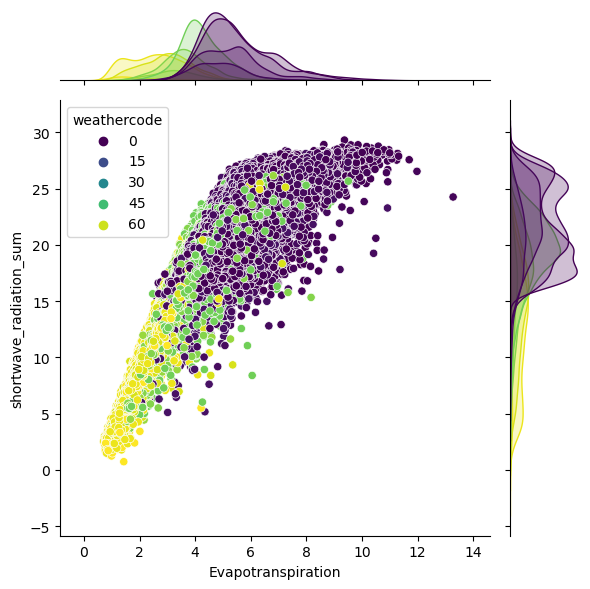

In [38]:
# Joint plot of Shortwave Radiation and Evapotranspiration, hue='weathercode':

sns.jointplot(x = 'et0_fao_evapotranspiration', y='shortwave_radiation_sum', data=df, hue='weathercode', kind='scatter', palette='viridis', height=6)
plt.xlabel('Evapotranspiration')
plt.ylabel('shortwave_radiation_sum')
plt.tight_layout()
plt.show()

Text(0, 0.5, 'shortwave_radiation_sum')

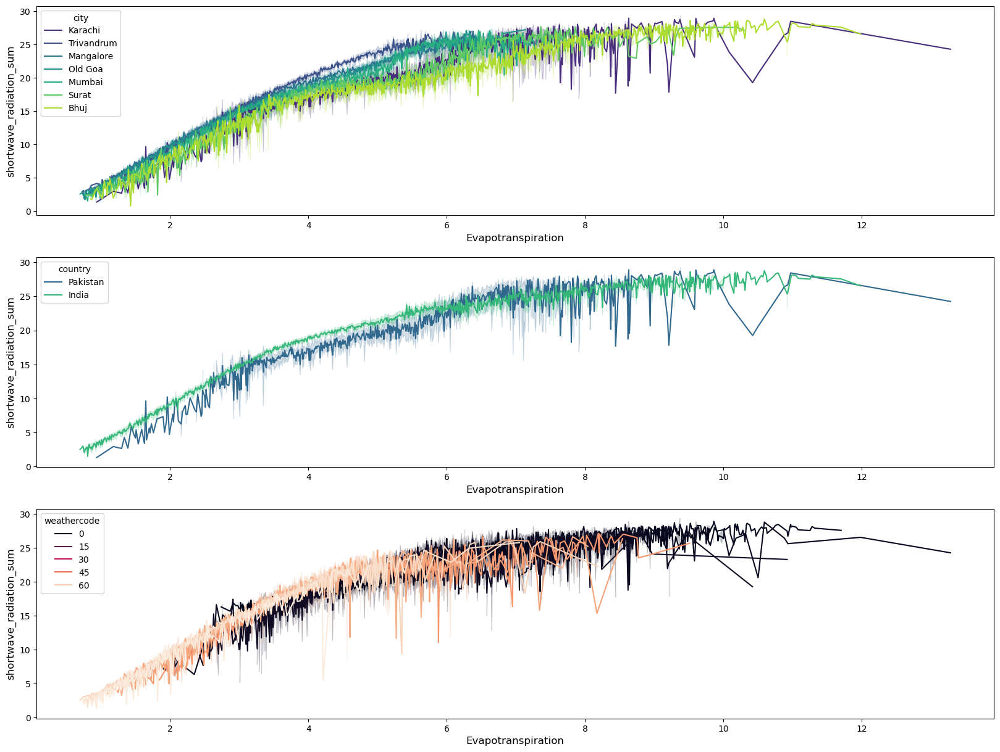

In [39]:
# Line plot of Shortwave Radiation and Evapotranspiration :

plt.figure(figsize = (20,15))

#hue='city'
plt.subplot(3,1,1)
sns.lineplot(x = 'et0_fao_evapotranspiration', y='shortwave_radiation_sum' , hue='city', palette='viridis', data = df)
plt.xlabel('Evapotranspiration', fontsize=12)
plt.ylabel('shortwave_radiation_sum', fontsize=12)

# hue='country'
plt.subplot(3,1,2)
sns.lineplot(x = 'et0_fao_evapotranspiration', y='shortwave_radiation_sum' , hue='country', palette='viridis', data = df)
plt.xlabel('Evapotranspiration', fontsize=12)
plt.ylabel('shortwave_radiation_sum', fontsize=12)

#hue='weathercode'
plt.subplot(3,1,3)
sns.lineplot(x = 'et0_fao_evapotranspiration', y='shortwave_radiation_sum' , hue='weathercode', palette='rocket', data = df)
plt.xlabel('Evapotranspiration', fontsize=12)
plt.ylabel('shortwave_radiation_sum', fontsize=12)

**Shortwave Radiation and Temperature_Max** 

Text(0, 0.5, 'shortwave_radiation_sum')

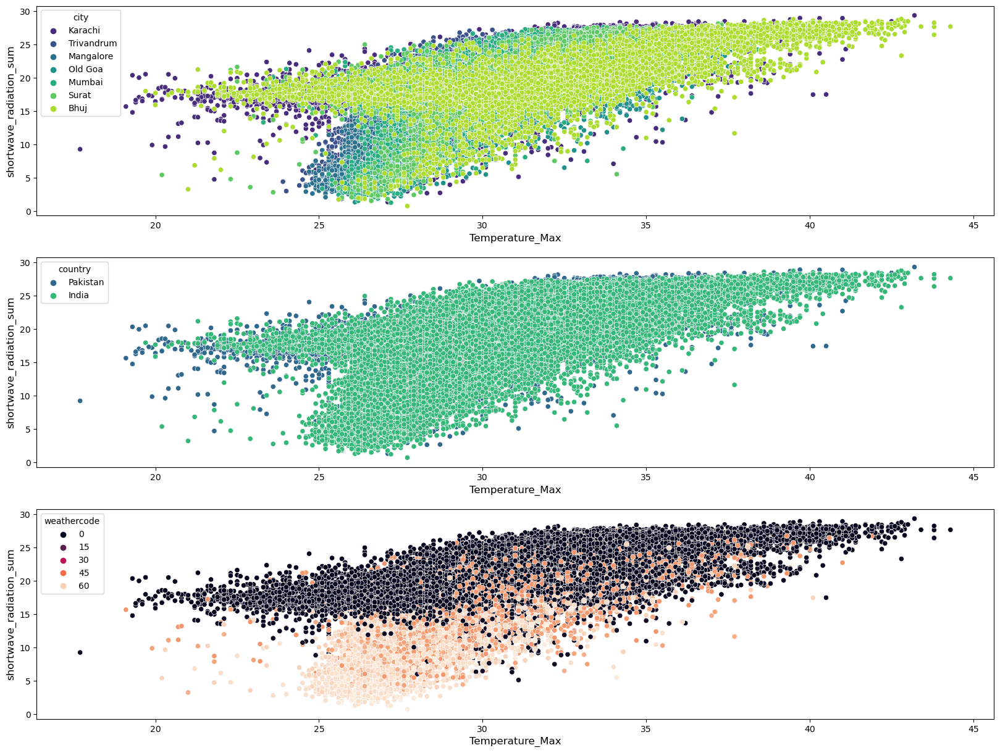

In [40]:
# Scater plot of Shortwave Radiation and Temperature_Max: 

plt.figure(figsize = (20,15))

#hue='city'
plt.subplot(3,1,1)
sns.scatterplot(x = 'temperature_2m_max', y='shortwave_radiation_sum' , hue='city', palette='viridis', data = df)
plt.xlabel('Temperature_Max', fontsize=12)
plt.ylabel('shortwave_radiation_sum', fontsize=12)

# hue='country'
plt.subplot(3,1,2)
sns.scatterplot(x = 'temperature_2m_max', y='shortwave_radiation_sum' , hue='country', palette='viridis', data = df)
plt.xlabel('Temperature_Max', fontsize=12)
plt.ylabel('shortwave_radiation_sum', fontsize=12)

#hue='weathercode'
plt.subplot(3,1,3)
sns.scatterplot(x = 'temperature_2m_max', y='shortwave_radiation_sum' , hue='weathercode', palette='rocket', data = df)
plt.xlabel('Temperature_Max', fontsize=12)
plt.ylabel('shortwave_radiation_sum', fontsize=12)

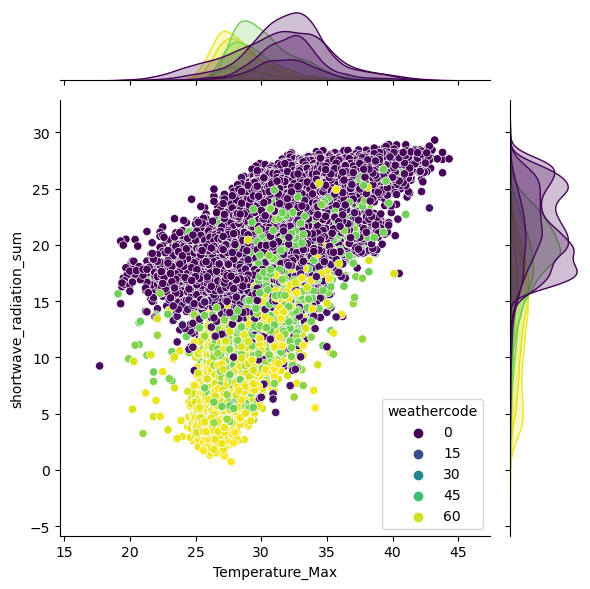

In [41]:
# Joint plot of Shortwave Radiation and  and Temperature_Max , hue='weathercode':

sns.jointplot(x = 'temperature_2m_max', y='shortwave_radiation_sum', data=df, hue='weathercode', kind='scatter', palette='viridis', height=6)
plt.xlabel('Temperature_Max')
plt.ylabel('shortwave_radiation_sum')
plt.tight_layout()
plt.show()

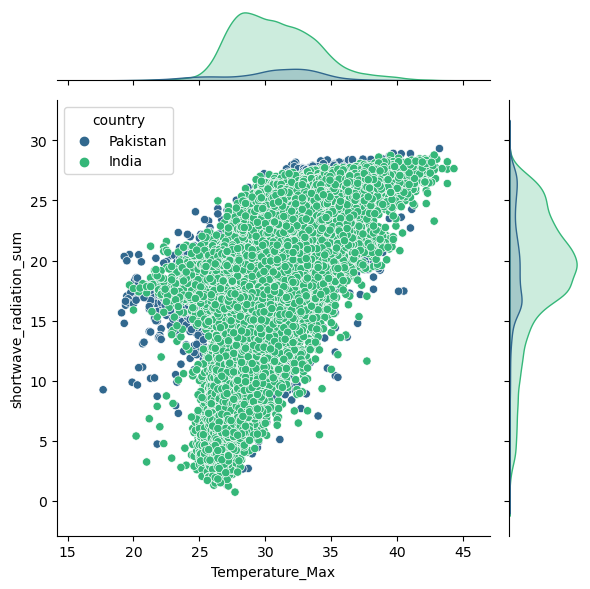

In [42]:
# Joint plot of Shortwave Radiation and  and Temperature_Max , hue='country':

sns.jointplot(x = 'temperature_2m_max', y='shortwave_radiation_sum', data=df, hue='country', kind='scatter', palette='viridis', height=6)
plt.xlabel('Temperature_Max')
plt.ylabel('shortwave_radiation_sum')
plt.tight_layout()
plt.show()

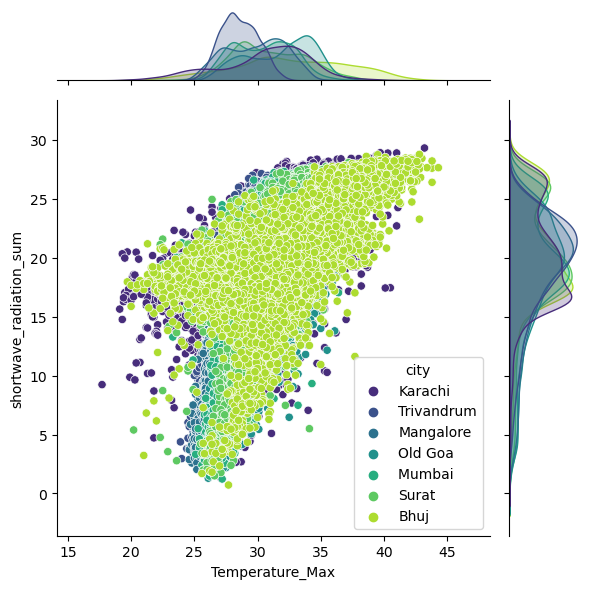

In [43]:
# Joint plot of Shortwave Radiation and  and Temperature_Max , hue='city':

sns.jointplot(x = 'temperature_2m_max', y='shortwave_radiation_sum', data=df, hue='city', kind='scatter', palette='viridis', height=6)
plt.xlabel('Temperature_Max')
plt.ylabel('shortwave_radiation_sum')
plt.tight_layout()
plt.show()

Text(0, 0.5, 'shortwave_radiation_sum')

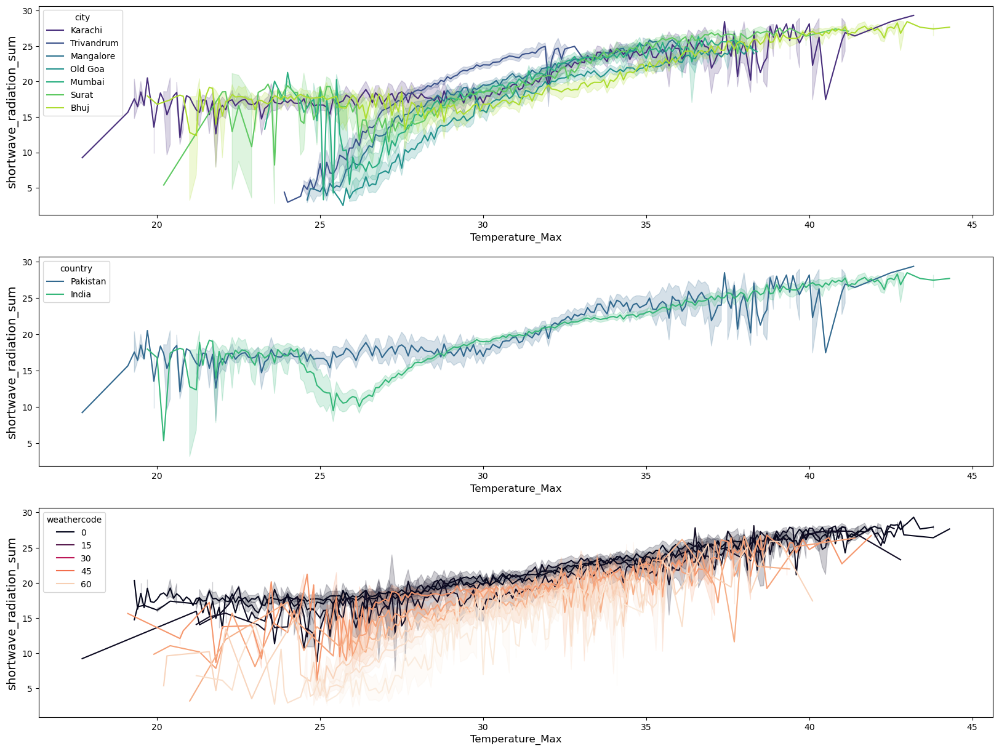

In [44]:
# Line plot of Shortwave Radiation and Temperature_Max:

plt.figure(figsize = (20,15))

# hue='city'
plt.subplot(3,1,1)
sns.lineplot(x = 'temperature_2m_max', y='shortwave_radiation_sum' , hue='city', palette='viridis', data = df)
plt.xlabel('Temperature_Max', fontsize=12)
plt.ylabel('shortwave_radiation_sum', fontsize=14)

# hue='country'
plt.subplot(3,1,2)
sns.lineplot(x = 'temperature_2m_max', y='shortwave_radiation_sum' , hue='country', palette='viridis', data = df)
plt.xlabel('Temperature_Max', fontsize=12)
plt.ylabel('shortwave_radiation_sum', fontsize=14)

#hue='weathercode'
plt.subplot(3,1,3)
sns.lineplot(x = 'temperature_2m_max', y='shortwave_radiation_sum' , hue='weathercode', palette='rocket', data = df)
plt.xlabel('Temperature_Max', fontsize=12)
plt.ylabel('shortwave_radiation_sum', fontsize=14)

**Shortwave Radiation and Precipitation_Rate**

Text(0, 0.5, 'shortwave_radiation_sum')

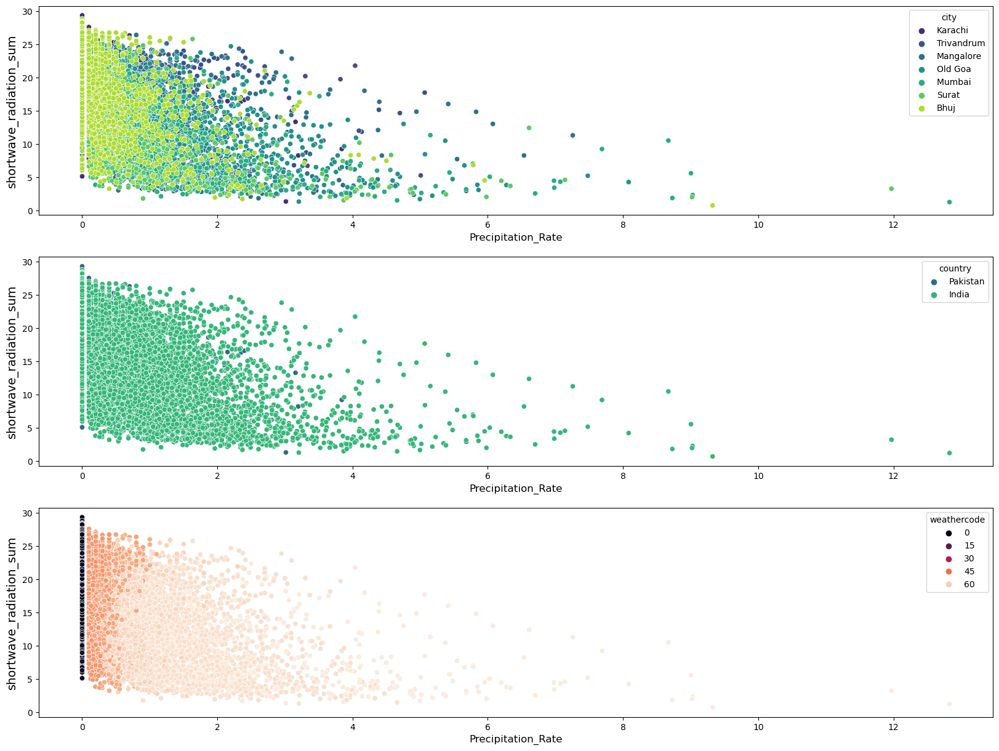

In [45]:
# Scatter plot of Shortwave Radiation and Precipitation_Rate:

plt.figure(figsize = (20,15))

#hue='city'
plt.subplot(3,1,1)
sns.scatterplot(x = 'precipitation_rate', y='shortwave_radiation_sum' , hue='city', palette='viridis', data = df)
plt.xlabel('Precipitation_Rate', fontsize=12)
plt.ylabel('shortwave_radiation_sum', fontsize=14)

# hue='country'
plt.subplot(3,1,2)
sns.scatterplot(x = 'precipitation_rate', y='shortwave_radiation_sum' , hue='country', palette='viridis', data = df)
plt.xlabel('Precipitation_Rate', fontsize=12)
plt.ylabel('shortwave_radiation_sum', fontsize=14)

#hue='weathercode'
plt.subplot(3,1,3)
sns.scatterplot(x = 'precipitation_rate', y='shortwave_radiation_sum' , hue='weathercode', palette='rocket', data = df)
plt.xlabel('Precipitation_Rate', fontsize=12)
plt.ylabel('shortwave_radiation_sum', fontsize=14)

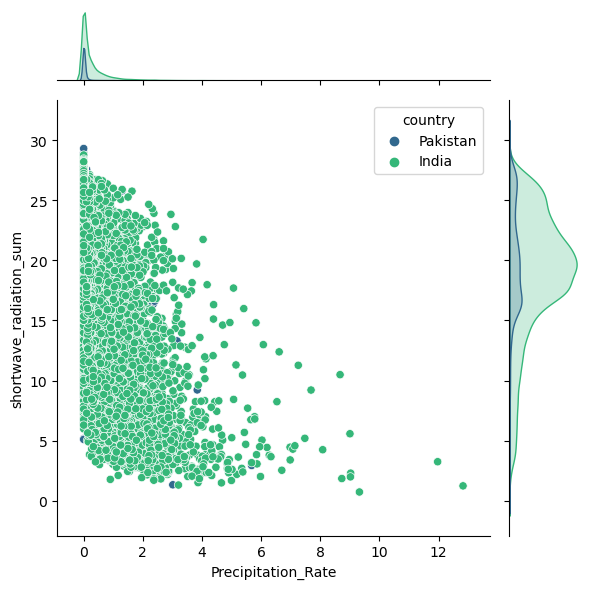

In [46]:
# Joint plot of Shortwave Radiation and Precipitation_Rate , hue='country':

sns.jointplot(x = 'precipitation_rate', y='shortwave_radiation_sum', data=df, hue='country', kind='scatter', palette='viridis', height=6)
plt.xlabel('Precipitation_Rate')
plt.ylabel('shortwave_radiation_sum')
plt.tight_layout()
plt.show()

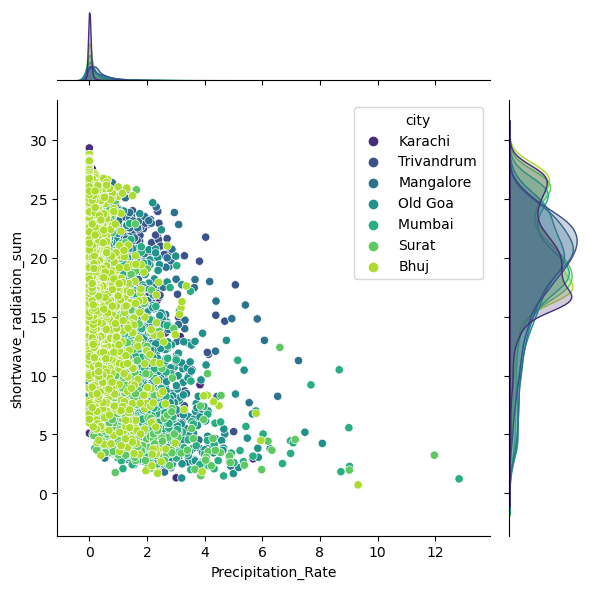

In [47]:
# Joint plot of Shortwave Radiation and Precipitation_Rate , hue='city':

sns.jointplot(x = 'precipitation_rate', y='shortwave_radiation_sum', data=df, hue='city', kind='scatter', palette='viridis', height=6)
plt.xlabel('Precipitation_Rate')
plt.ylabel('shortwave_radiation_sum')
plt.tight_layout()
plt.show()

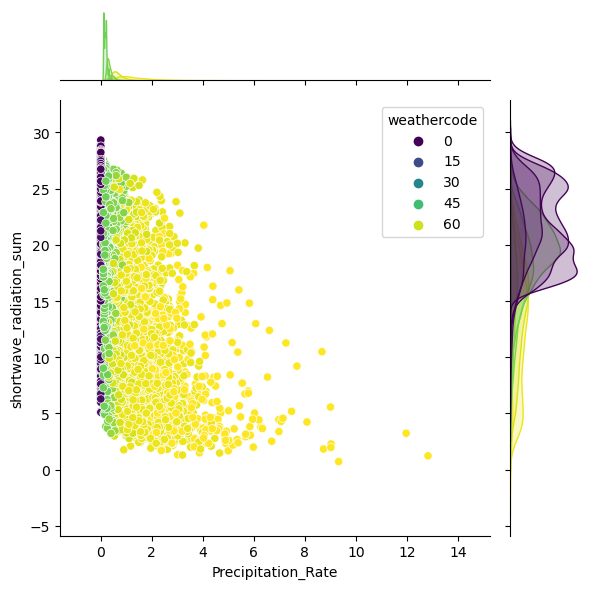

In [48]:
# Joint plot of Shortwave Radiation and Precipitation_Rate , hue='weathercode':

sns.jointplot(x = 'precipitation_rate', y='shortwave_radiation_sum', data=df, hue='weathercode', kind='scatter', palette='viridis', height=6)
plt.xlabel('Precipitation_Rate')
plt.ylabel('shortwave_radiation_sum')
plt.tight_layout()
plt.show()

Text(0, 0.5, 'shortwave_radiation_sum')

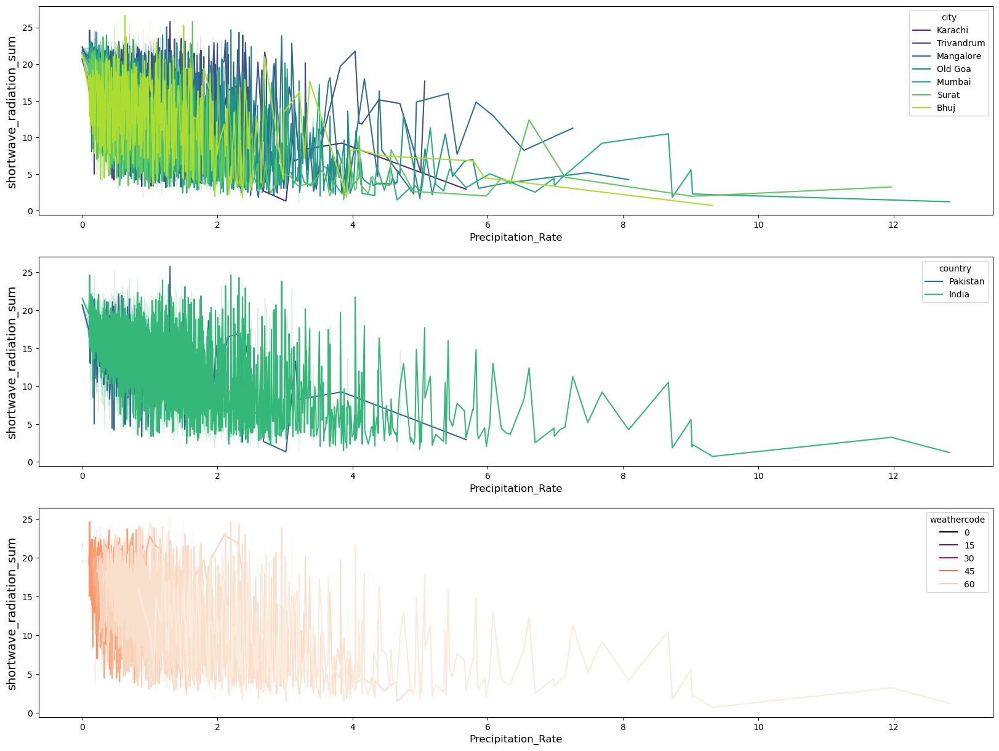

In [49]:
# Line plot of Shortwave Radiation and Precipitation_Rate, :

plt.figure(figsize = (20,15))

# hue='city'
plt.subplot(3,1,1)
sns.lineplot(x = 'precipitation_rate', y='shortwave_radiation_sum' , hue='city', palette='viridis', data = df)
plt.xlabel('Precipitation_Rate', fontsize=12)
plt.ylabel('shortwave_radiation_sum', fontsize=14)

# hue='country'
plt.subplot(3,1,2)
sns.lineplot(x = 'precipitation_rate', y='shortwave_radiation_sum' , hue='country', palette='viridis', data = df)
plt.xlabel('Precipitation_Rate', fontsize=12)
plt.ylabel('shortwave_radiation_sum', fontsize=14)

#hue='weathercode'
plt.subplot(3,1,3)
sns.lineplot(x = 'precipitation_rate', y='shortwave_radiation_sum' , hue='weathercode', palette='rocket', data = df)
plt.xlabel('Precipitation_Rate', fontsize=12)
plt.ylabel('shortwave_radiation_sum', fontsize=14)

**Time**

In [50]:
df["time"].info()

<class 'pandas.core.series.Series'>
RangeIndex: 34762 entries, 0 to 34761
Series name: time
Non-Null Count  Dtype         
--------------  -----         
34762 non-null  datetime64[ns]
dtypes: datetime64[ns](1)
memory usage: 271.7 KB


In [51]:
# Extracting year-month-day from the 'time' column:

df['year']=df['time'].dt.year
df['month']=df['time'].dt.month
df['day']=df['time'].dt.day

In [52]:
df.columns

Index(['time', 'weathercode', 'temperature_2m_max', 'temperature_2m_min',
       'temperature_2m_mean', 'apparent_temperature_max',
       'apparent_temperature_min', 'apparent_temperature_mean', 'sunrise',
       'sunset', 'shortwave_radiation_sum', 'precipitation_sum',
       'precipitation_hours', 'windspeed_10m_max', 'windgusts_10m_max',
       'winddirection_10m_dominant', 'et0_fao_evapotranspiration', 'latitude',
       'longitude', 'elevation', 'country', 'city', 'precipitation_rate',
       'year', 'month', 'day'],
      dtype='object')

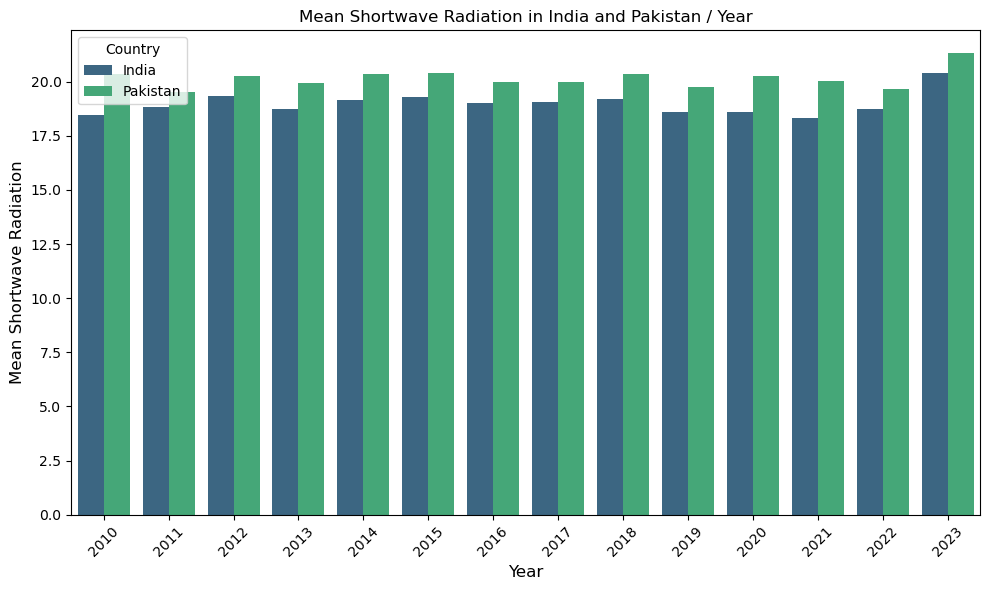

In [53]:
# Mean Shortwave Radiation grouped by Country and Year - Mean:

average_Shortwave_year=df.groupby(['country',"year"])[["shortwave_radiation_sum"]].aggregate('mean')
average_Shortwave_year = average_Shortwave_year.reset_index()

plt.figure(figsize=(10, 6))
sns.set_palette("viridis")  

colors = sns.color_palette("viridis", n_colors=len(average_Shortwave_year["country"].unique()))

sns.barplot(x="year", y="shortwave_radiation_sum", hue="country", data=average_Shortwave_year, palette=colors)
plt.xlabel("Year", fontsize=12)
plt.ylabel("Mean Shortwave Radiation", fontsize=12)
plt.title("Mean Shortwave Radiation in India and Pakistan / Year", fontsize=12)
plt.xticks(rotation=45)
plt.tight_layout()
plt.legend(title="Country")
plt.show()


In [54]:
# average_Shortwave_year

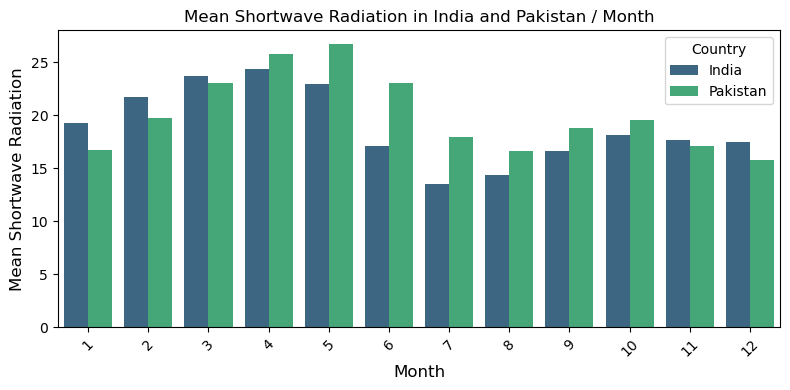

In [55]:
# Mean Shortwave Radiation grouped by Country and Month - Mean:

average_Shortwave_month=df.groupby(['country',"month"])[["shortwave_radiation_sum"]].aggregate('mean')
average_Shortwave_month = average_Shortwave_month.reset_index()


# Create a bar plot using seaborn for both countries
plt.figure(figsize=(8,4))
sns.set_palette("viridis")  

# Use a list of colors for each country
colors = sns.color_palette("viridis", n_colors=len(average_Shortwave_month["country"].unique()))

sns.barplot(x="month", y="shortwave_radiation_sum", hue="country", data=average_Shortwave_month, palette=colors)
plt.xlabel("Month", fontsize=12)
plt.ylabel("Mean Shortwave Radiation", fontsize=12)
plt.title("Mean Shortwave Radiation in India and Pakistan / Month", fontsize=12)
plt.xticks(rotation=45)
plt.tight_layout()
plt.legend(title="Country")
plt.show()

In [56]:
# average_Shortwave_month

In [57]:
# DF for India:

country_to_filter = 'India'
df_India = df[df['country'] == country_to_filter]
# df_India.head()

In [58]:
# DF for Pakistan:

country_to_filter = 'Pakistan'
df_Pakistan = df[df['country'] == country_to_filter]
# df_Pakistan.head()

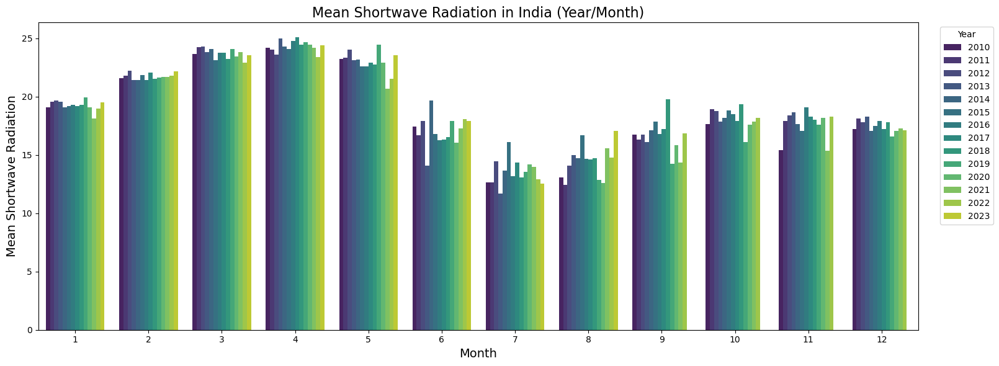

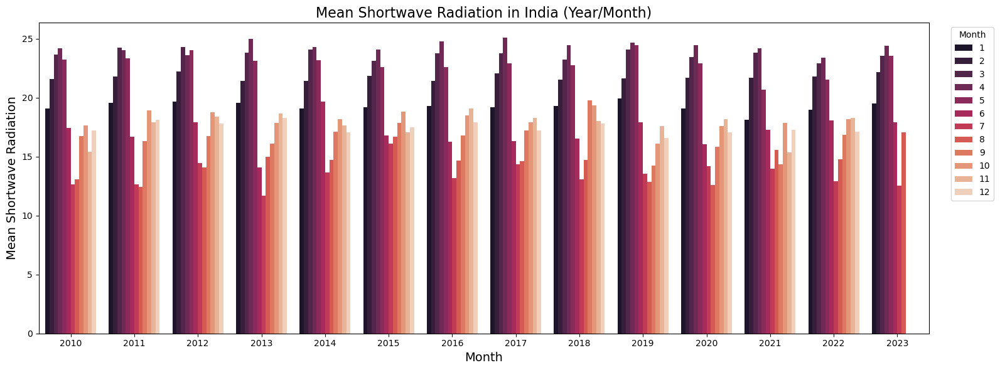

In [59]:
# Mean Shortwave Radiation grouped by Month and Year in India, hue="year":

average_Shortwave_year_month=df_India.groupby(["year", "month"])[["shortwave_radiation_sum"]].aggregate('mean')
average_Shortwave_year_month = average_Shortwave_year_month.reset_index()

plt.figure(figsize=(15, 6))
sns.set_palette("viridis")  

colors = sns.color_palette("viridis", n_colors=len(average_Shortwave_year_month["year"].unique()))

sns.barplot(x="month", y="shortwave_radiation_sum", hue="year", data=average_Shortwave_year_month, palette=colors)
plt.xlabel("Month", fontsize=14)
plt.ylabel("Mean Shortwave Radiation", fontsize=14)
plt.title("Mean Shortwave Radiation in India (Year/Month)", fontsize=16)
#plt.xticks(rotation=45)
plt.tight_layout()
plt.legend(title="Year",  bbox_to_anchor=(1.02, 1), loc="upper left")
plt.show()


# Mean Shortwave Radiation group by Month and Year in India, hue="month":

average_Shortwave_year_month=df_India.groupby(["year", "month"])[["shortwave_radiation_sum"]].aggregate('mean')
average_Shortwave_year_month = average_Shortwave_year_month.reset_index()

plt.figure(figsize=(15, 6))
sns.set_palette("rocket")  

colors = sns.color_palette("rocket", n_colors=len(average_Shortwave_year_month["month"].unique()))

sns.barplot(x="year", y="shortwave_radiation_sum", hue="month", data=average_Shortwave_year_month, palette=colors)
plt.xlabel("Month", fontsize=14)
plt.ylabel("Mean Shortwave Radiation", fontsize=14)
plt.title("Mean Shortwave Radiation in India (Year/Month)", fontsize=16)
#plt.xticks(rotation=45)
plt.tight_layout()
plt.legend(title="Month",  bbox_to_anchor=(1.02, 1), loc="upper left")
plt.show()


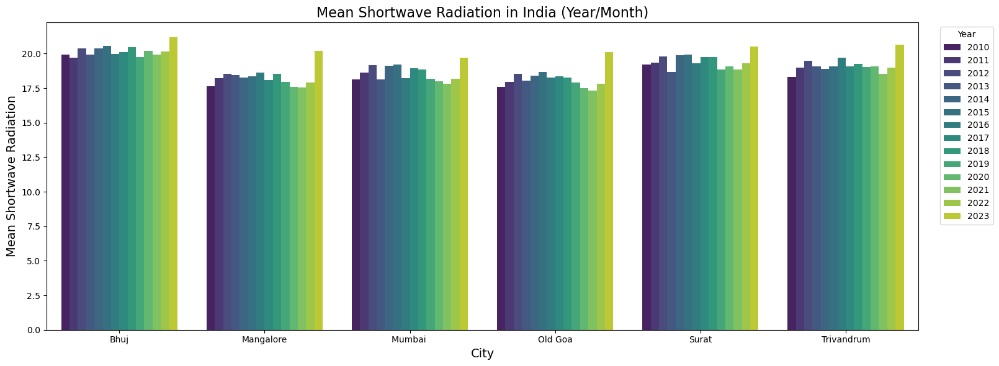

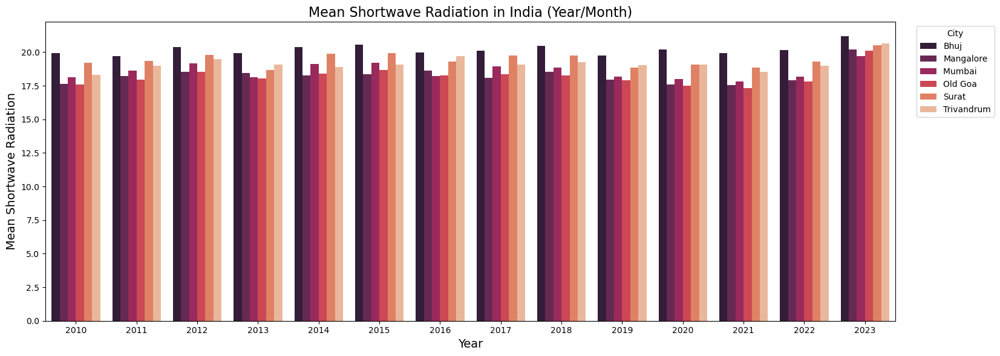

In [60]:
# Mean Shortwave Radiation group by City and Year in India, hue="year":

average_Shortwave_year_city=df_India.groupby(["year", "city"])[["shortwave_radiation_sum"]].aggregate('mean')
average_Shortwave_year_city = average_Shortwave_year_city.reset_index()

plt.figure(figsize=(15, 6))
sns.set_palette("viridis")  

colors = sns.color_palette("viridis", n_colors=len(average_Shortwave_year_city["year"].unique()))

sns.barplot(x="city", y="shortwave_radiation_sum", hue="year", data=average_Shortwave_year_city, palette=colors)
plt.xlabel("City", fontsize=14)
plt.ylabel("Mean Shortwave Radiation", fontsize=14)
plt.title("Mean Shortwave Radiation in India (Year/Month)", fontsize=16)
#plt.xticks(rotation=45)
plt.tight_layout()
plt.legend(title="Year",  bbox_to_anchor=(1.02, 1), loc="upper left")
plt.show()


# Mean Shortwave Radiation group by City and Year in India, hue="city":

average_Shortwave_year_city=df_India.groupby(["year", "city"])[["shortwave_radiation_sum"]].aggregate('mean')
average_Shortwave_year_city = average_Shortwave_year_city.reset_index()

plt.figure(figsize=(15, 6))
sns.set_palette("rocket")  

colors = sns.color_palette("rocket", n_colors=len(average_Shortwave_year_city["city"].unique()))

sns.barplot(x="year", y="shortwave_radiation_sum", hue="city", data=average_Shortwave_year_city, palette=colors)
plt.xlabel("Year", fontsize=14)
plt.ylabel("Mean Shortwave Radiation", fontsize=14)
plt.title("Mean Shortwave Radiation in India (Year/Month)", fontsize=16)
#plt.xticks(rotation=45)
plt.tight_layout()
plt.legend(title="City",  bbox_to_anchor=(1.02, 1), loc="upper left")
plt.show()

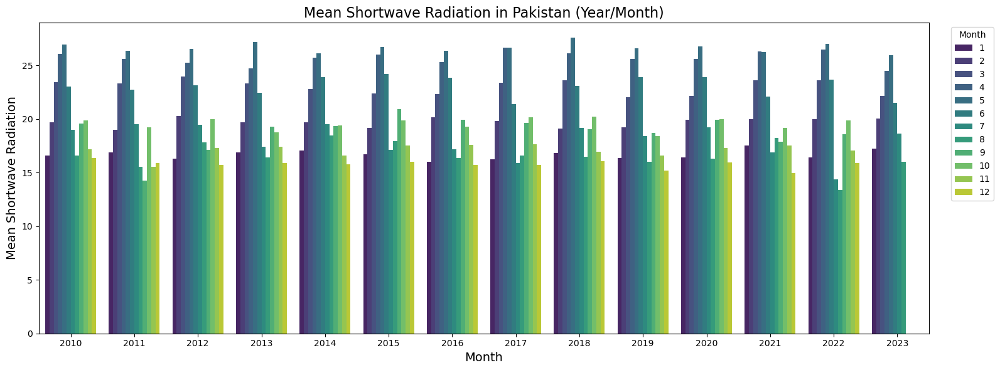

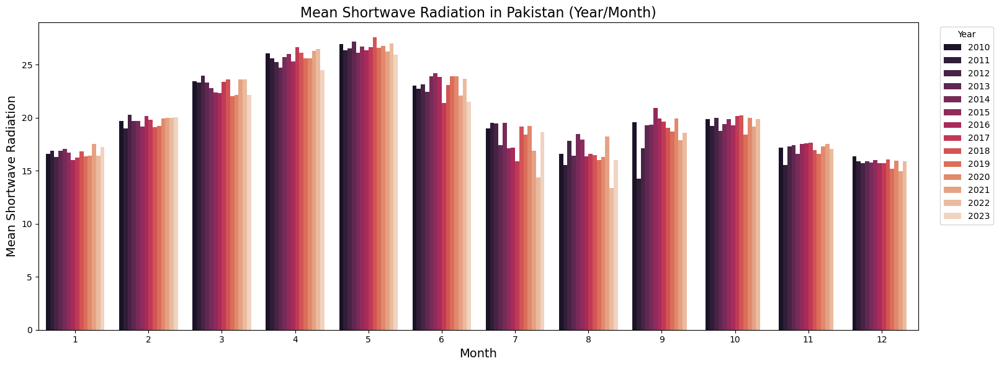

In [61]:
# Mean Shortwave Radiation grouped by Month and Year in Pakistan, hue="month":

average_Shortwave_year_month=df_Pakistan.groupby(["year", "month"])[["shortwave_radiation_sum"]].aggregate('mean')
average_Shortwave_year_month = average_Shortwave_year_month.reset_index()

plt.figure(figsize=(15, 6))
sns.set_palette("viridis")  


colors = sns.color_palette("viridis", n_colors=len(average_Shortwave_year_month["month"].unique()))

sns.barplot(x="year", y="shortwave_radiation_sum", hue="month", data=average_Shortwave_year_month, palette=colors)
plt.xlabel("Month", fontsize=14)
plt.ylabel("Mean Shortwave Radiation", fontsize=14)
plt.title("Mean Shortwave Radiation in Pakistan (Year/Month)", fontsize=16)
#plt.xticks(rotation=45)
plt.tight_layout()
plt.legend(title="Month",  bbox_to_anchor=(1.02, 1), loc="upper left")
plt.show()



# Mean Shortwave Radiation group by Month and Year in Pakistan, hue="year":

average_Shortwave_year_month=df_Pakistan.groupby(["year", "month"])[["shortwave_radiation_sum"]].aggregate('mean')
average_Shortwave_year_month = average_Shortwave_year_month.reset_index()

plt.figure(figsize=(15, 6))
sns.set_palette("rocket")  

colors = sns.color_palette("rocket", n_colors=len(average_Shortwave_year_month["year"].unique()))

sns.barplot(x="month", y="shortwave_radiation_sum", hue="year", data=average_Shortwave_year_month, palette=colors)
plt.xlabel("Month", fontsize=14)
plt.ylabel("Mean Shortwave Radiation", fontsize=14)
plt.title("Mean Shortwave Radiation in Pakistan (Year/Month)", fontsize=16)
#plt.xticks(rotation=45)
plt.tight_layout()
plt.legend(title="Year", bbox_to_anchor=(1.02, 1), loc="upper left")
plt.show()

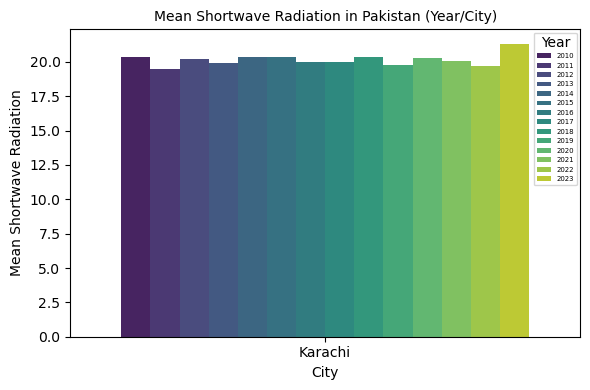

In [62]:
# Mean Shortwave Radiation group by City and Year in Pakistan, hue="year":

average_Shortwave_year_city=df_Pakistan.groupby(["year", "city"])[["shortwave_radiation_sum"]].aggregate('mean')
average_Shortwave_year_city = average_Shortwave_year_city.reset_index()

plt.figure(figsize=(6, 4))
sns.set_palette("viridis")  

colors = sns.color_palette("viridis", n_colors=len(average_Shortwave_year_month["year"].unique()))

sns.barplot(x="city", y="shortwave_radiation_sum", hue="year", data=average_Shortwave_year_city, palette=colors)
plt.xlabel("City", fontsize=10)
plt.ylabel("Mean Shortwave Radiation", fontsize=10)
plt.title("Mean Shortwave Radiation in Pakistan (Year/City)", fontsize=10)
#plt.xticks(rotation=45)
plt.tight_layout()
plt.legend(title="Year", fontsize=5)
plt.show()